# 3. Fitting diads once you have groups
- Once you have divided your diads into groups based on strengths, you need to tweak the fit parameters for each group
- Then you can loop through all files in a given group and automatically fit the spectra

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import joblib
import DiadFit as pf
pf.__version__

'0.0.88'

## Specifying filetype, and folder as before

In [2]:
# This specifies what file type your Raman exported in. 
meta_path, spectra_path, spectra_filetype, prefix, str_prefix, spectra_file_ext, meta_file_ext, TruPower=pf.get_settings()

## Load in data and fit parameters
- This loads in the dataframes of the fit parameters you saved in the other file, by group
- At this point you select what group you want to fit (batch = 'Weak', 'Medium' or 'Strong'). After running through the entire notebook for one group, come back up here to fit a second group.

In [16]:
## load dataframes and numpy arrays 
np_x = joblib.load('np_x.sav')

# Select the group you want to fit ('Weak', 'Medium', 'Strong'). After selecting one, go through and select another one and run again from here. 
batch='Weak' # Options are Weak, Medium, Strong

if batch=='Weak':
    GroupN_df=joblib.load('Weak_df.sav')
if batch=='Medium':
    GroupN_df=joblib.load('Medium_df.sav')
if batch=='Strong':
    GroupN_df=joblib.load('Strong_df.sav')

### Now load one file from this group to tweak parameters for

In [17]:
Diad_Files =GroupN_df['filename']
i=0


### Lets plot the diad to have a look at it

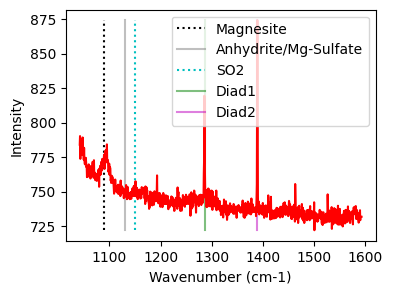

In [18]:
plot1=pf.plot_diad(path=spectra_path, filename=Diad_Files[i], filetype=spectra_filetype)

## Now lets inspect the diads and get their approximate positions
- As with generic peak, you can exclude 2 segments (e.g. around cosmic rays)
- You then specify how many peaks you want to fit on each diad. 1 means just the strong peak, 2 hotbands, and 3 for Diad2 would also fit the C13 peak if present. 
- The identify_diad_peaks then uses scipy findpeaks to identify the positions of the 2 diads, and any other peaks the user asks for. These are saved, and fed into the later functions for peak fitting. 

## Choose a model for fitting all peaks
- Option of Voigt or PseudoVoigt. We recomend PsuedoVoigt

In [19]:
model_name='PseudoVoigtModel'

## Fit Diad 1
- Tweak the parameters in the config files for each group. E.g. how many peaks (fit_peaks), the background positions, the sigma of the diad, and whether or not you want a gaussian background

In [20]:
diad_id_config=pf.diad_id_config(height=50, exclude_range1=[1308, 1309])
diad_id_config

if batch=='Weak':
    diad1_fit_config_init=pf.diad1_fit_config(
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=1, lower_bck_diad1=(1180, 1250),
    upper_bck_diad1=(1300, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=100, 
    HB_prom=GroupN_df['HB1_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i])
    diad1_fit_config_init

if batch=='Medium':
    diad1_fit_config_init=pf.diad1_fit_config(
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=2, lower_bck_diad1=(1180, 1240),
    upper_bck_diad1=(1315, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=100, 
    HB_prom=GroupN_df['HB1_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i])
    diad1_fit_config_init

if batch=='Strong':
    diad1_fit_config_init=pf.diad1_fit_config(
    fit_gauss=True, gauss_amp= 2*GroupN_df['HB1_abs_prom'].iloc[i],
    model_name=model_name, fit_peaks=2,
    N_poly_bck_diad1=1, lower_bck_diad1=(1180, 1220),
    upper_bck_diad1=(1330, 1350),
    diad_sigma=0.6,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=1000, 
    HB_prom=GroupN_df['HB1_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i])
diad1_fit_config_init

diad1_fit_config(model_name='PseudoVoigtModel', fit_peaks=2, N_poly_bck_diad1=1, lower_bck_diad1=(1180, 1250), upper_bck_diad1=(1300, 1350), fit_gauss=False, gauss_amp=1000, diad_sigma=0.6, diad_sigma_min_allowance=0.2, diad_sigma_max_allowance=5, diad_prom=85.29675130224246, HB_prom=nan, x_range_baseline=30, y_range_baseline=100, dpi=200, x_range_residual=10, return_other_params=False)

### See what these fit parameters look like for diad1

,Diad1_Combofit_Cent,Diad1_Voigt_Cent,Diad1_cent_err,Diad1_Voigt_Area,Diad1_Voigt_Sigma,Diad1_Voigt_Gamma,Diad1_Combofit_Height,Diad1_Residual,Diad1_Prop_Lor,Diad1_fwhm,Diad1_refit,Diad1_Asym50,Diad1_Asym70,Diad1_Yuan2017_sym_factor,Diad1_Remigi2021_BSF,Diad1_PDF_Model
0,1285.808995,1285.808995,0.027226,172.736868,0.606514,0,90.655557,3.744921,1.0,1.213028,Flagged Warnings:,1.038147,1.135081,0.046274,0.013381,PseudoVoigtModel


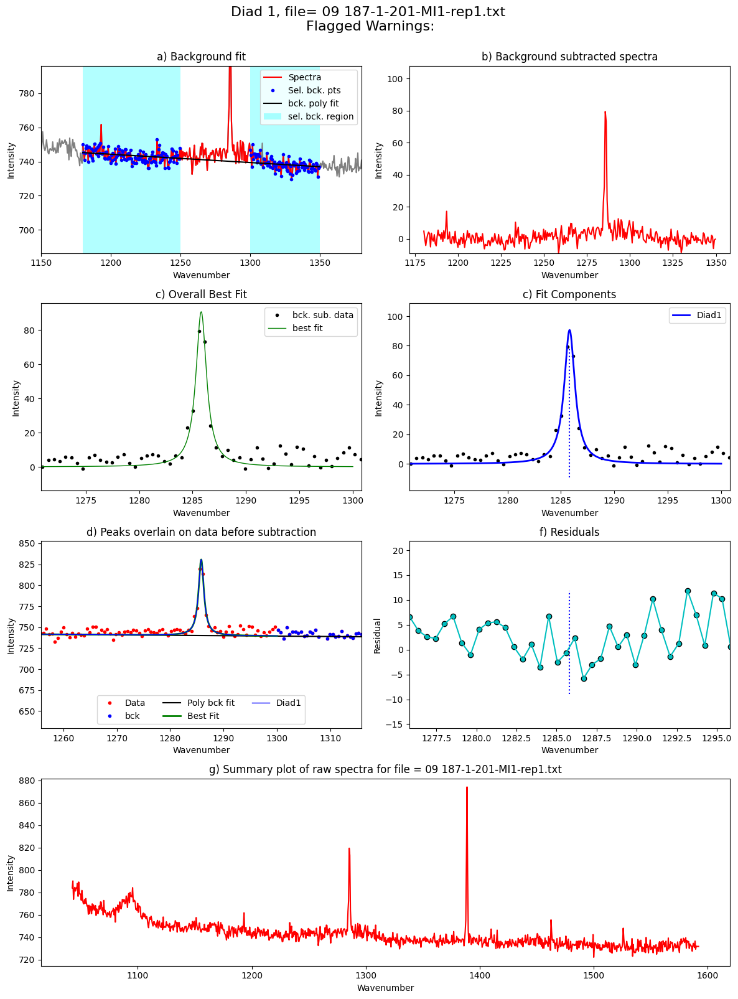

In [21]:
Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config_init,
config2=diad_id_config,
path=spectra_path, filename=Diad_Files.iloc[0],
filetype=spectra_filetype, plot_figure=True, close_figure=False,
Diad_pos=GroupN_df['Diad1_pos'].iloc[i],
HB_pos=GroupN_df['HB1_pos'].iloc[i])
Diad1_fit

### Update the sigma
- The sigma parameter varies quite a lot based on the splitting. Best to update your first guess with what you found for the example file above

In [22]:
diad1_fit_config2=diad1_fit_config_init

## Fit diad2

In [23]:
if batch=='Weak':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=2, upper_bck_diad2=(1430, 1480),
    lower_bck_diad2=(1310, 1360), diad_sigma=0.4,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=100,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i])
    diad2_fit_config_init

if batch=='Medium':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=3, fit_gauss=True, gauss_amp= 2*GroupN_df['HB2_abs_prom'].iloc[i],
    lower_bck_diad2=(1310, 1350), diad_sigma=1,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=100,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i],
    C13_prom=GroupN_df['C13_abs_prom'].iloc[i])
    diad2_fit_config_init

if batch=='Strong':
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name,
    fit_peaks=3, fit_gauss=True, gauss_amp= 2*GroupN_df['HB2_abs_prom'].iloc[i],
    lower_bck_diad2=(1310, 1340), diad_sigma=1,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=1000,  
    x_range_baseline=30,
    HB_prom=GroupN_df['HB2_abs_prom'].iloc[i], 
    diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i],
    C13_prom=GroupN_df['C13_abs_prom'].iloc[i])
    diad2_fit_config_init
diad2_fit_config_init

diad2_fit_config(model_name='PseudoVoigtModel', fit_peaks=2, N_poly_bck_diad2=2, lower_bck_diad2=(1310, 1360), upper_bck_diad2=(1430, 1480), fit_gauss=False, gauss_amp=1000, diad_sigma=0.4, diad_sigma_min_allowance=0.2, diad_sigma_max_allowance=5, diad_prom=138.43881776748697, HB_prom=nan, C13_prom=10, x_range_baseline=30, y_range_baseline=100, plot_figure=True, dpi=200, x_range_residual=30, return_other_params=False)

### See what these fit parameters look like for diad2

,Diad2_Combofit_Cent,Diad2_Voigt_Cent,Diad2_cent_err,Diad2_Voigt_Area,Diad2_Voigt_Sigma,Diad2_Voigt_Gamma,Diad2_Combofit_Height,Diad2_Residual,Diad2_Prop_Lor,Diad2_fwhm,Diad2_refit,Diad2_Asym50,Diad2_Asym70,Diad2_Yuan2017_sym_factor,Diad2_Remigi2021_BSF,Diad2_PDF_Model
0,1389.005853,1389.005853,0.013972,176.745952,0.521605,0,138.021406,2.474847,0.4121,1.043211,Flagged Warnings:,1.067114,1.091133,0.070014,0.007558,PseudoVoigtModel


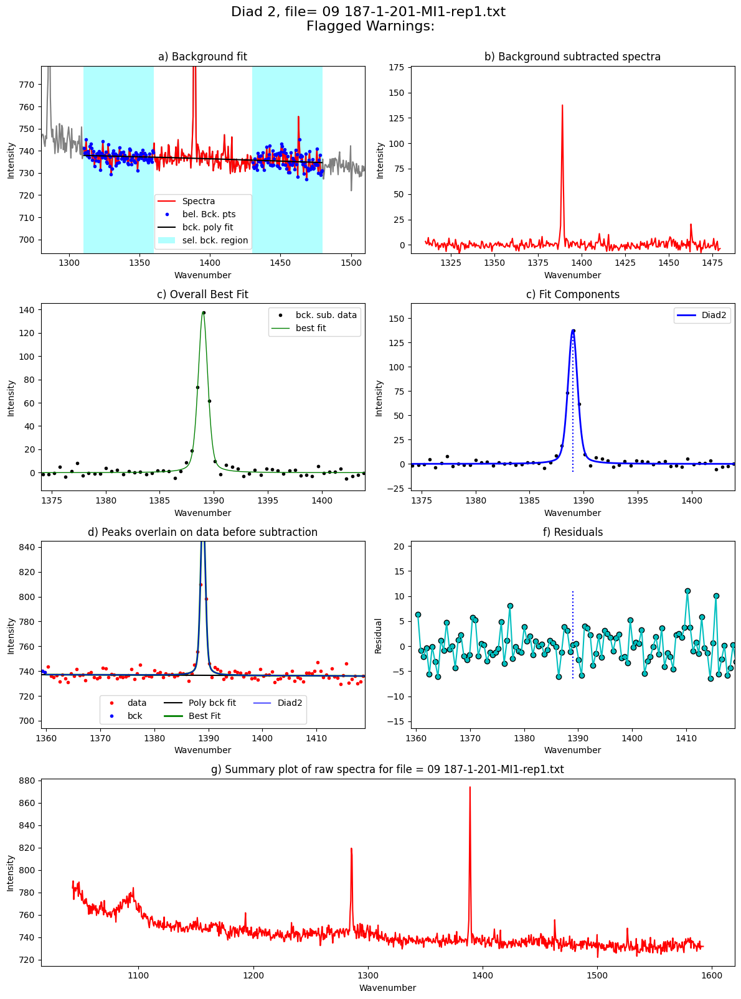

In [24]:
Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config_init,
    config2=diad_id_config,
path=spectra_path, filename=Diad_Files[i], filetype=spectra_filetype,
plot_figure=True, close_figure=False, 
Diad_pos=GroupN_df['Diad2_pos'].iloc[i],
HB_pos=GroupN_df['HB2_pos'].iloc[i], 
C13_pos=GroupN_df['C13_pos'].iloc[i])
Diad2_fit.to_clipboard(excel=True)
Diad2_fit

## Loop over all the files in the group
- This will loop over all the 

  0%|          | 0/16 [00:00<?, ?it/s]

Processing file: 09 187-1-201-MI1-rep1.txt


  6%|▋         | 1/16 [00:03<00:50,  3.39s/it]

Processing file: 10 187-1-201-MI1-rep2.txt


 12%|█▎        | 2/16 [00:08<01:03,  4.51s/it]

Processing file: 11 187-1-201-MI1-rep3.txt


 19%|█▉        | 3/16 [00:16<01:20,  6.22s/it]

Processing file: 14 187-1-201-FI2.txt


 25%|██▌       | 4/16 [00:25<01:27,  7.28s/it]

Processing file: 15 187-1-201-FI3.txt


 31%|███▏      | 5/16 [00:35<01:27,  7.96s/it]

Processing file: 16 187-1-201-FI4.txt


 38%|███▊      | 6/16 [00:44<01:23,  8.35s/it]

Processing file: 17 187-1-201-FI5.txt


 44%|████▍     | 7/16 [00:54<01:21,  9.01s/it]

Processing file: 27 187-1-203-xtal4-FI1.txt


 50%|█████     | 8/16 [01:04<01:13,  9.22s/it]

Processing file: 30 187-1-203-xtal4-FI2.txt


 56%|█████▋    | 9/16 [01:12<01:03,  9.07s/it]

Processing file: 31 187-1-204-MI1-rep1.txt


 62%|██████▎   | 10/16 [01:21<00:53,  8.95s/it]c:\users\charl\documents\python dev\diadfit\src\DiadFit\diads.py:3104: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,axes=plt.subplot_mosaic(mosaic=figure_mosaic, figsize=(12, 16))


Processing file: 32 187-1-204-MI1-rep2-20mw.txt


 69%|██████▉   | 11/16 [01:30<00:44,  8.80s/it]

Processing file: 34 187-1-204-FI1_CRR_DiadFit.txt


 75%|███████▌  | 12/16 [01:38<00:35,  8.80s/it]

Processing file: 35 187-1-204-FI2.txt


 81%|████████▏ | 13/16 [01:47<00:26,  8.87s/it]

Processing file: 37 187-1-205-MI1.txt


 88%|████████▊ | 14/16 [01:57<00:17,  8.97s/it]

Processing file: 38 187-1-205-MI2-unquantdiad.txt
below your threshold intensity, we have filled with nans


 94%|█████████▍| 15/16 [02:05<00:08,  8.74s/it]

Processing file: 42 187-1-206-MI1_CRR_DiadFit.txt


100%|██████████| 16/16 [02:13<00:00,  8.34s/it]


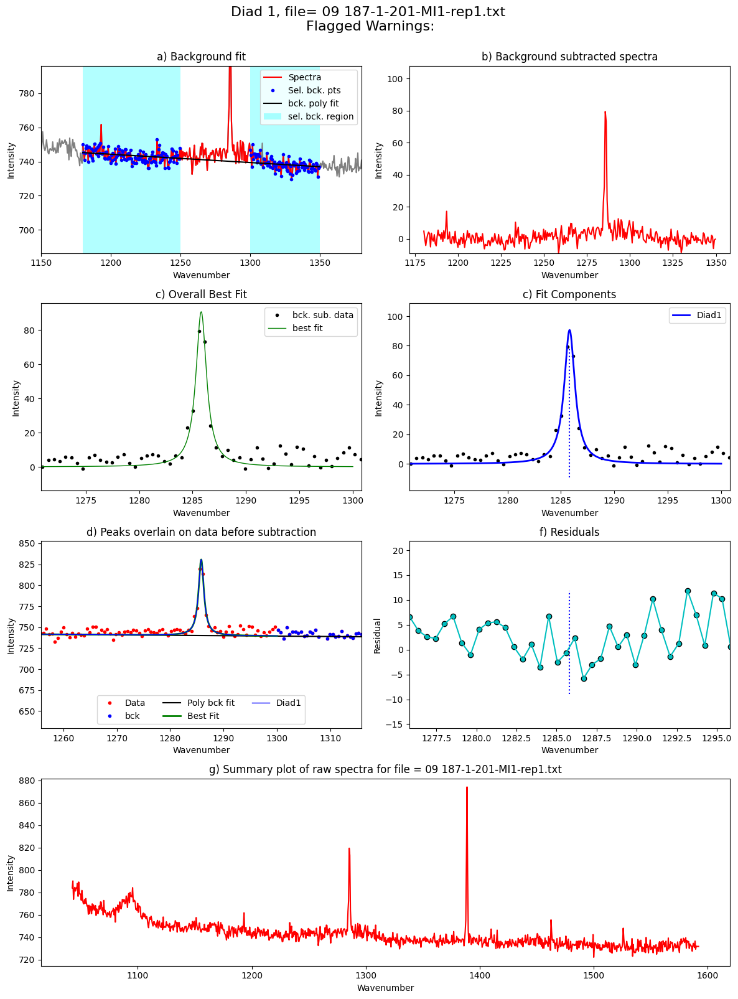

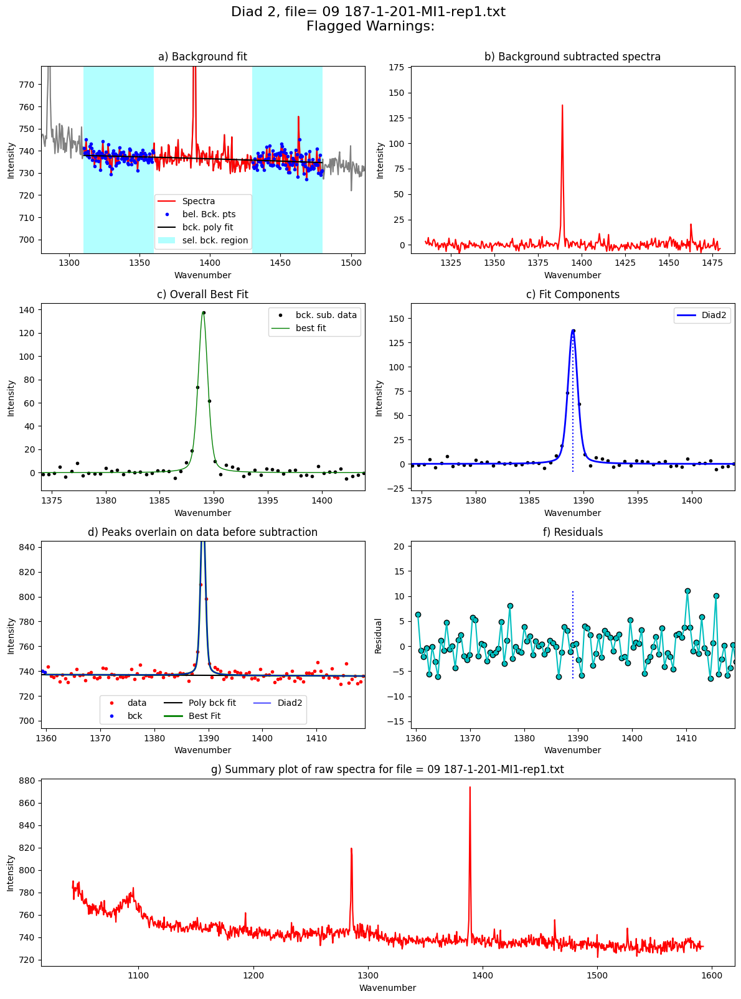

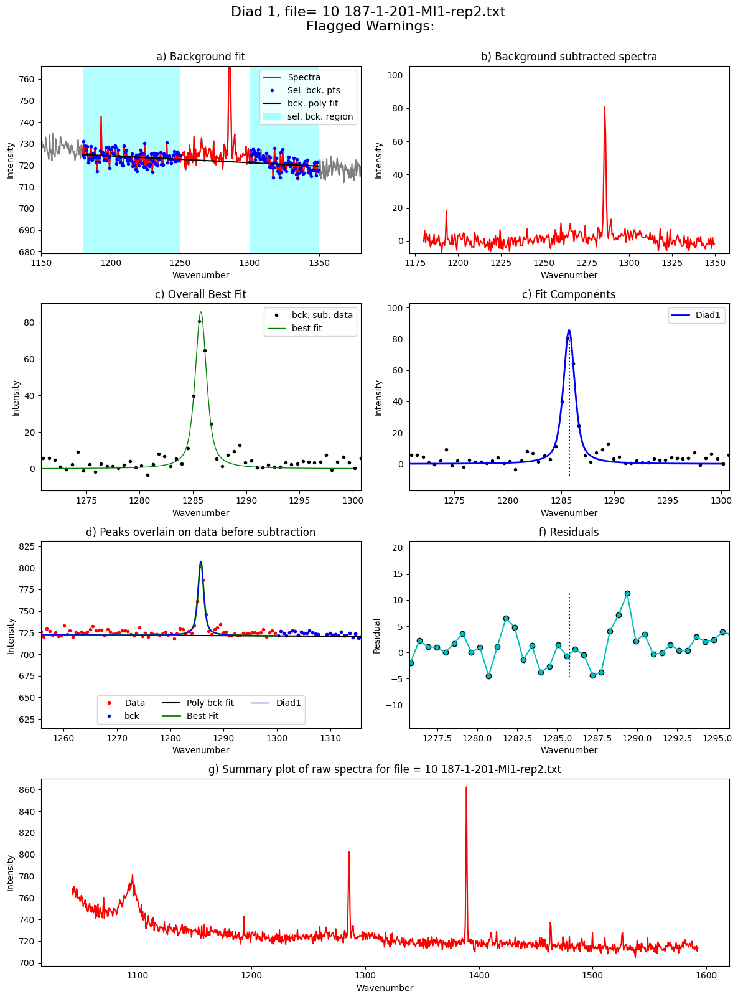

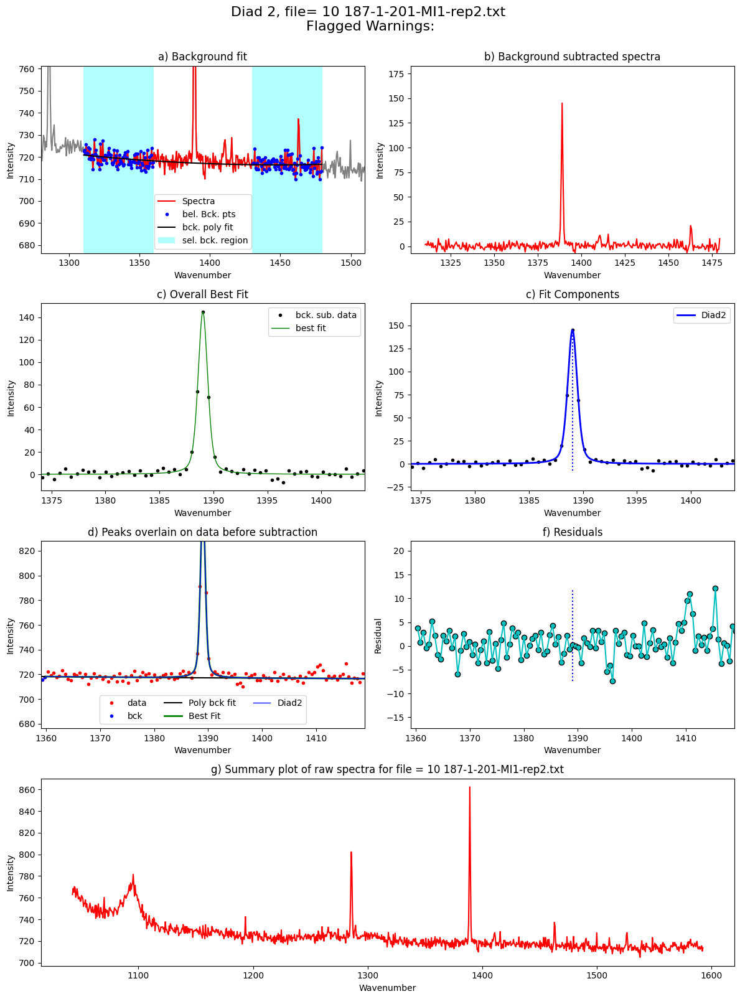

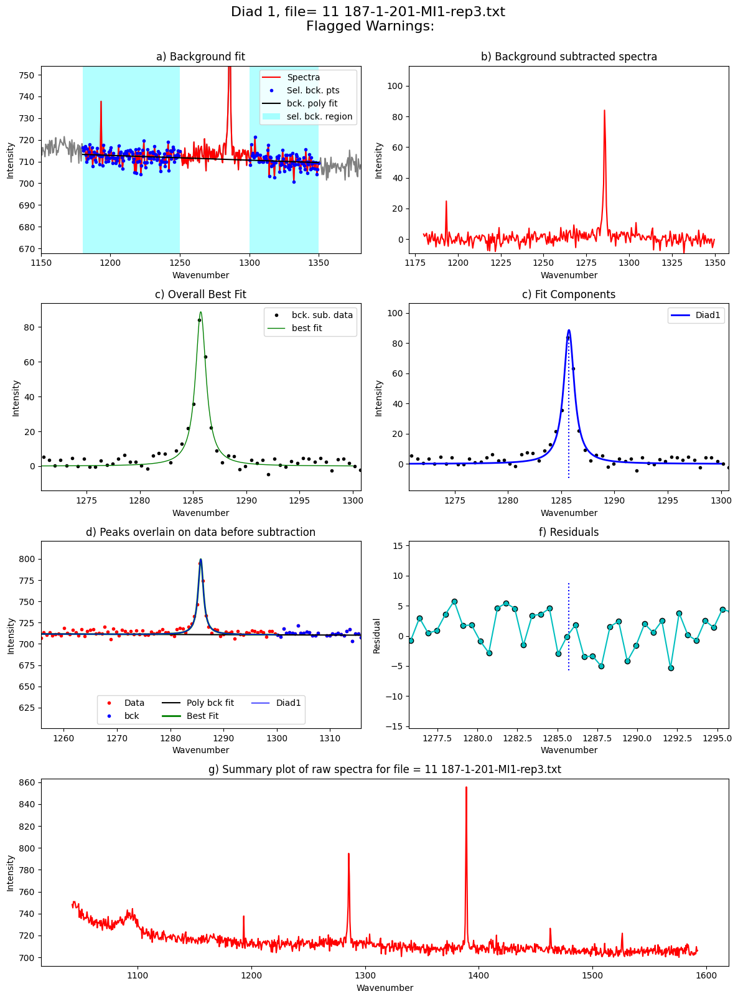

...

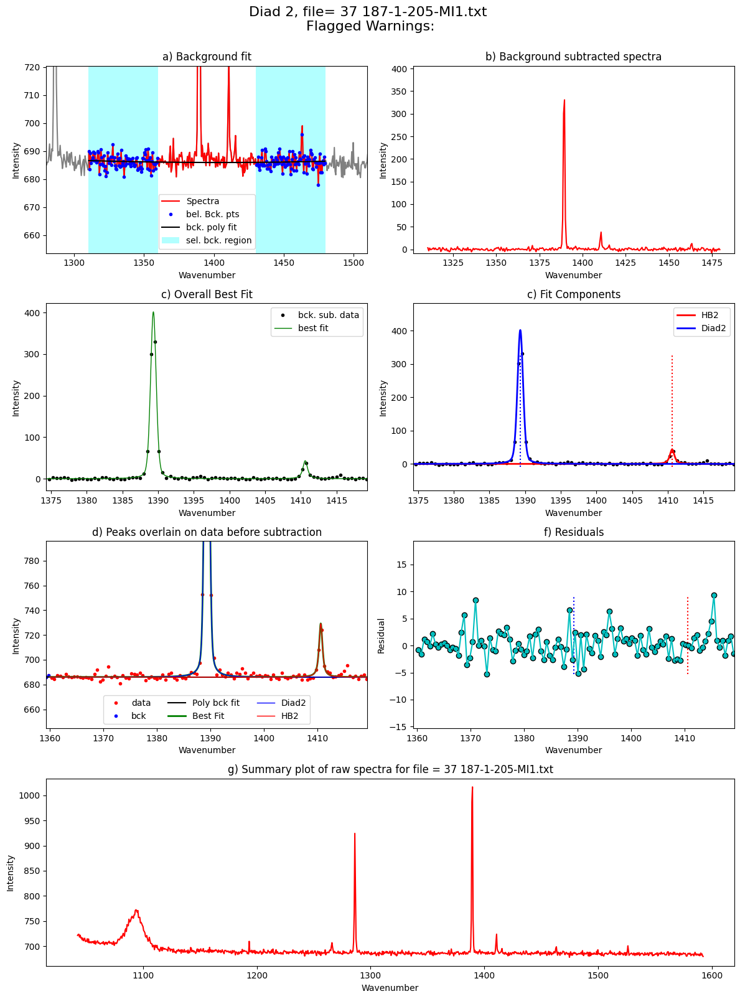

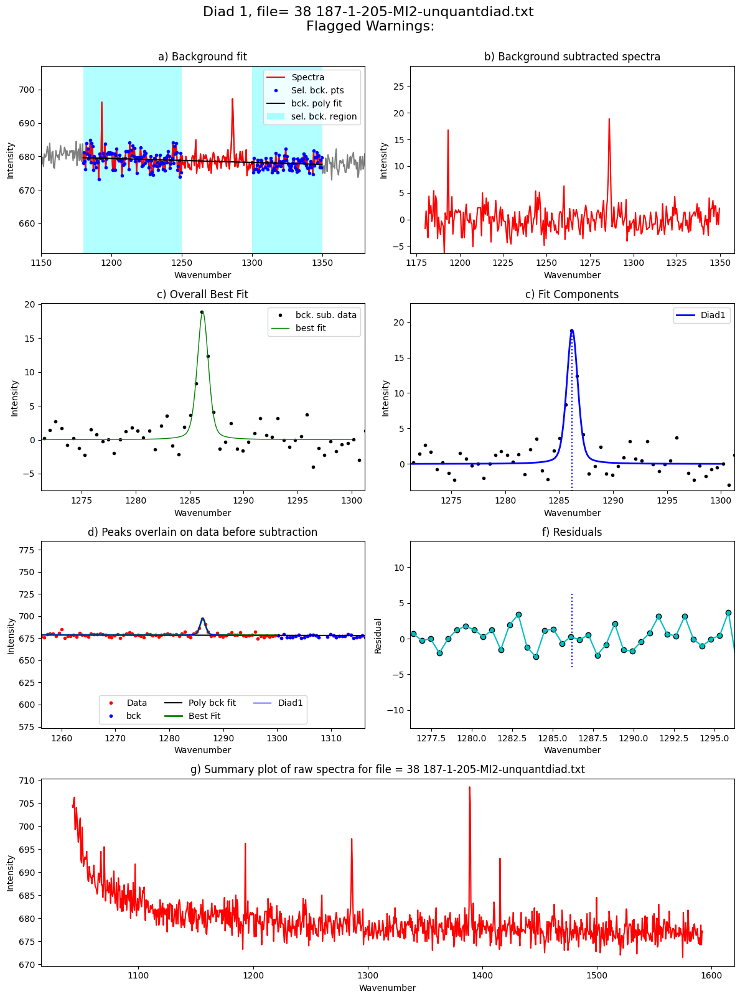

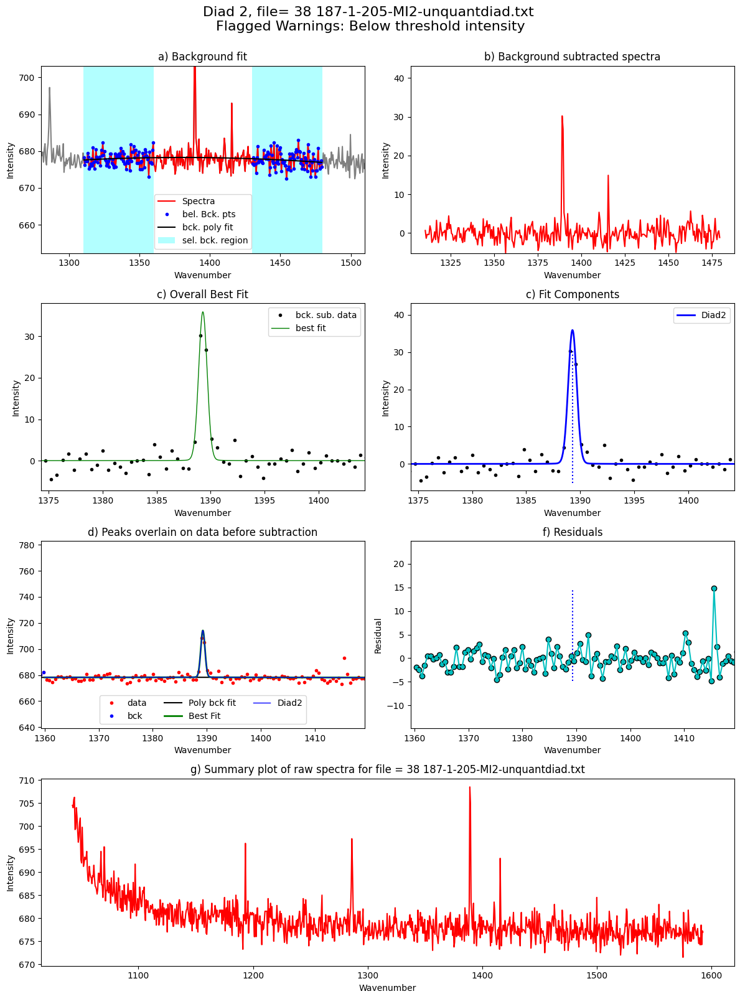

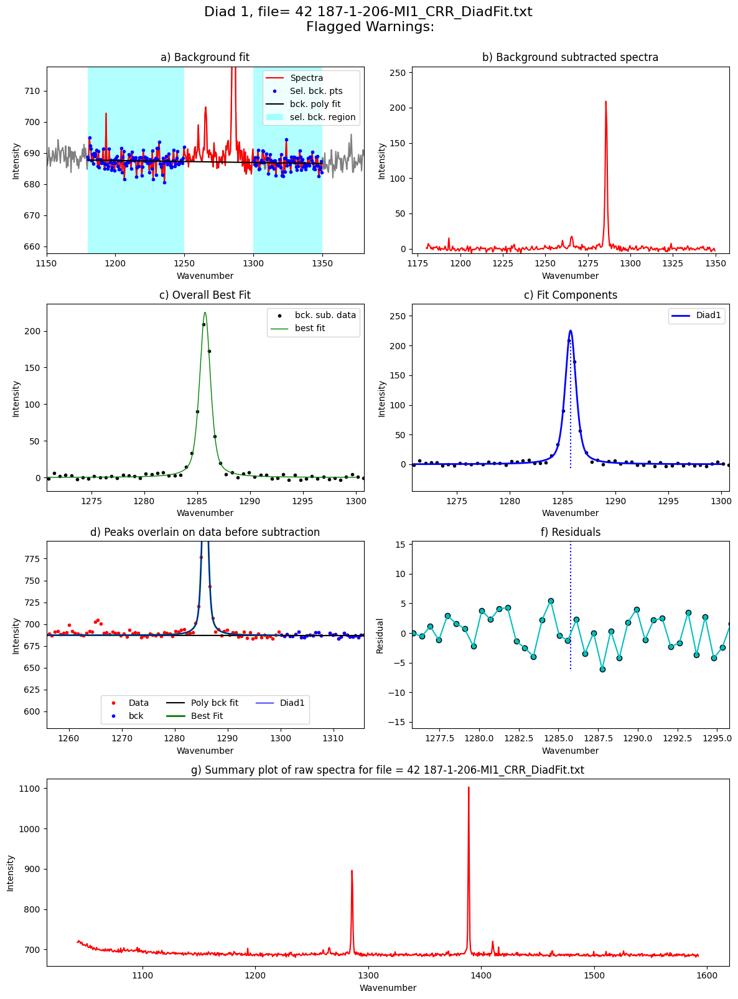

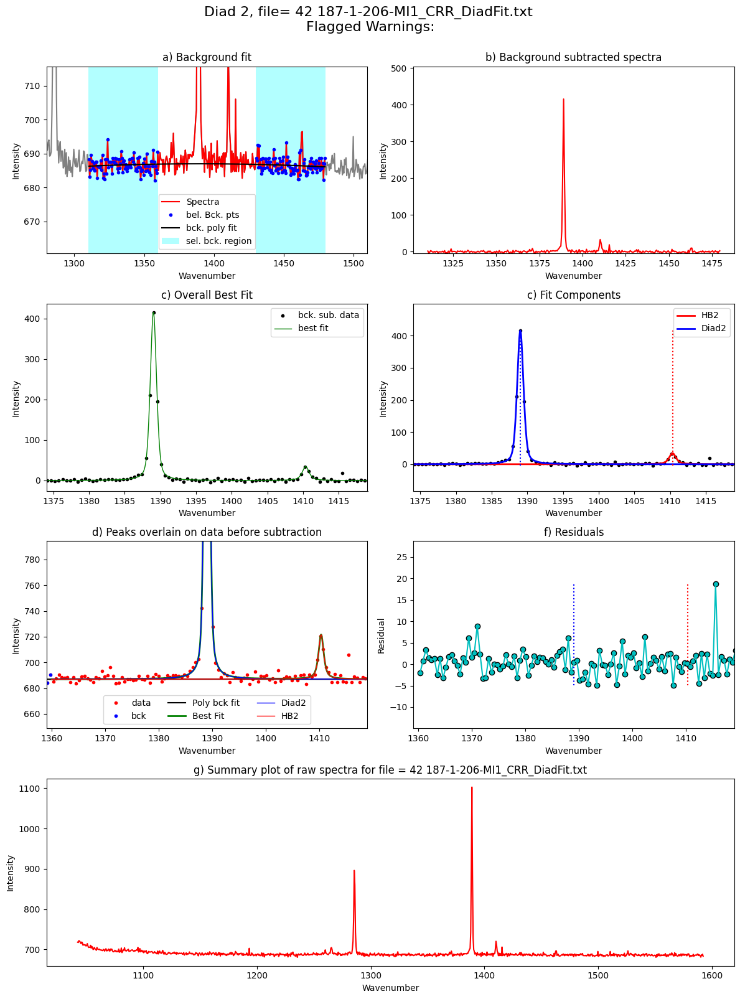

In [25]:
from tqdm import tqdm
plot_figure=True# If False, Means doesnt have to make figures, lot faster. 
close_figure=False # If True, wont show figures in notebook, but will still save them in a folder 
Diad_Files_i=Diad_Files
df_Merge = pd.DataFrame([])
for i in tqdm(range(0, len(Diad_Files))): #
    tqdm.write(f"Processing file: {Diad_Files[i]}")
    
    
    # For diad1, config file like you had in the previous. 
    # Only really used to exclude a range (say your spectra has a known spec)
    diad_id_config=pf.diad_id_config(exclude_range1=[1308, 1309])
    
    # Here, the prominence are taken from the fitting in the last notebook
    diad1_fit_config2.HB_prom=GroupN_df['HB1_abs_prom'].iloc[i]
    diad1_fit_config2.diad_prom=GroupN_df['Diad1_abs_prom'].iloc[i]
    diad1_fit_config2.gauss_amp=2*GroupN_df['HB1_abs_prom'].iloc[i]

    Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config2,
    config2=diad_id_config, path=spectra_path, filename=GroupN_df['filename'].iloc[i],
    filetype=spectra_filetype, plot_figure=plot_figure, close_figure=close_figure,
    Diad_pos=GroupN_df['Diad1_pos'].iloc[i],
    HB_pos=GroupN_df['HB1_pos'].iloc[i])

    ## Same for diad2, just also has a C13 peak
    diad2_fit_config_init.HB_prom=GroupN_df['HB2_abs_prom'].iloc[i]
    diad2_fit_config_init.diad_prom=GroupN_df['Diad2_abs_prom'].iloc[i]
    diad2_fit_config_init.gauss_amp= 2*GroupN_df['HB2_abs_prom'].iloc[i]
    diad2_fit_config_init.C13_prom=GroupN_df['C13_abs_prom'].iloc[i]
    
    
    Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config_init,
        config2=diad_id_config,
    path=spectra_path, filename=GroupN_df['filename'].iloc[i], 
    filetype=spectra_filetype,
    plot_figure=plot_figure, close_figure=close_figure,
    Diad_pos=GroupN_df['Diad2_pos'].iloc[i],
    HB_pos=GroupN_df['HB2_pos'].iloc[i], 
    C13_pos=GroupN_df['C13_pos'].iloc[i])
    
    # This combines the outputs into a single dataframe
    data=pf.combine_diad_outputs(filename=GroupN_df['filename'].iloc[i], prefix=prefix, 
    Diad1_fit=Diad1_fit, path=spectra_path,                  
    Diad2_fit=Diad2_fit)        
    
 

    df_Merge = pd.concat([df_Merge, data], axis=0).reset_index(drop=True)


In [26]:
# Save parameters to excel
combo=df_Merge

if batch=='Weak':
    combo.to_excel('Weak_Diads.xlsx', index=False)
if batch=='Medium':
    combo.to_excel('Medium_Diads.xlsx', index=False)
if batch=='Strong':
    combo.to_excel('Strong_Diads.xlsx', index=False)

In [27]:
combo

,filename,Splitting,Split_σ,Diad1_Combofit_Cent,Diad1_cent_err,Diad1_Combofit_Height,Diad1_Voigt_Cent,Diad1_Voigt_Area,Diad1_Voigt_Sigma,Diad1_Residual,...,Diad1_Asym50,Diad1_Asym70,Diad1_Yuan2017_sym_factor,Diad1_Remigi2021_BSF,Diad2_Asym50,Diad2_Asym70,Diad2_Yuan2017_sym_factor,Diad2_Remigi2021_BSF,Diad1_PDF_Model,Diad2_PDF_Model
0,187-1-201-MI1-rep1,103.196858,0.030602,1285.808995,0.027226,90.655557,1285.808995,172.736868,0.606514,3.744921,...,1.038147,1.135081,0.046274,0.013381,1.067114,1.091133,0.070014,0.007558,PseudoVoigtModel,PseudoVoigtModel
1,187-1-201-MI1-rep2,103.285530,0.029277,1285.743404,0.025947,85.597057,1285.743404,152.840377,0.636577,3.107338,...,1.140584,1.094412,0.178984,0.014874,1.033003,1.042857,0.034786,0.007273,PseudoVoigtModel,PseudoVoigtModel
2,187-1-201-MI1-rep3,103.281816,0.029919,1285.727729,0.027006,88.756401,1285.727729,167.193620,0.599612,2.746320,...,1.202417,1.061265,0.242743,0.013511,1.068627,1.100000,0.073534,0.007214,PseudoVoigtModel,PseudoVoigtModel
3,187-1-201-FI2,104.325093,0.013907,1283.309394,0.013541,595.771763,1283.309394,1960.423294,1.080117,12.938673,...,1.060800,1.040043,0.131342,0.003626,1.010163,1.011594,0.016644,0.001360,PseudoVoigtModel,PseudoVoigtModel
4,187-1-201-FI3,104.243490,0.013877,1283.522592,0.013398,329.039068,1283.522592,1102.852355,1.177851,6.177361,...,1.165899,1.102213,0.390808,0.007159,1.093817,1.099112,0.154004,0.002320,PseudoVoigtModel,PseudoVoigtModel
5,187-1-201-FI4,104.360803,0.010755,1283.255126,0.010406,496.172589,1283.255126,1544.997484,1.077940,7.558378,...,1.033019,1.045861,0.071185,0.004345,1.014523,1.004386,0.023419,0.001547,PseudoVoigtModel,PseudoVoigtModel
6,187-1-201-FI5,104.324799,0.010092,1283.347748,0.009797,784.828383,1283.347798,2560.907774,1.088826,9.806415,...,1.010671,1.001073,0.023237,0.002775,1.020576,1.024566,0.033655,0.001008,PseudoVoigtModel,PseudoVoigtModel
7,187-1-203-xtal4-FI1,104.050814,0.004064,1283.976281,0.003401,716.267817,1283.976331,2143.904269,1.119168,2.696151,...,1.023041,1.069536,0.051575,0.003125,1.010593,1.044275,0.016837,0.001028,PseudoVoigtModel,PseudoVoigtModel
8,187-1-203-xtal4-FI2,104.068654,0.008709,1283.929274,0.008307,440.994730,1283.929274,1333.673977,1.124749,4.873739,...,1.155993,1.084895,0.350907,0.005101,1.012579,1.058036,0.020362,0.001739,PseudoVoigtModel,PseudoVoigtModel
9,187-1-204-MI1-rep1,103.304334,0.042771,1285.640599,0.038954,37.957025,1285.640599,57.082818,0.522543,1.409523,...,1.104377,1.086449,0.109083,0.027533,1.177049,1.150943,0.191221,0.016412,PseudoVoigtModel,PseudoVoigtModel


### This plays a sound when the notebook is done if you have a tendency to procrastinate

In [28]:
# !pip install winotify

from winotify import Notification, audio

toast= Notification(app_id="VSCode",title="Notebook completed",
                    msg="Step3b_Secondary_Peaks is done!",
                    duration="short")
toast.set_audio(audio.Mail,loop=False)
toast.show()